In [1]:
import scanpy as sc
import squidpy as sq
import numpy as np
import pandas as pd
from anndata import AnnData
import pathlib
import matplotlib.pyplot as plt
import matplotlib as mpl
import skimage
import seaborn as sns
import tangram as tg
import anndata as ad
import re
import math
import os

sc.logging.print_header()
print(f"squidpy=={sq.__version__}")

%load_ext autoreload
%autoreload 2
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

plt.rcParams["svg.fonttype"] = "none"
plt.rcParams["font.family"] = ["sans-serif"]
plt.rcParams["font.sans-serif"] = ["Arial"]
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["savefig.bbox"]="tight"
plt.rcParams["savefig.format"]='svg'

save_path ='/home/tbou/data/Bradl/exports/'


sc.set_figure_params(color_map = 'bwr',vector_friendly=True, format='svg')

/home/tbou/miniconda3/envs/squidpy_tangram/lib/python3.11/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
/home/tbou/miniconda3/envs/squidpy_tangram/lib/python3.11/site-packages/spatialdata/__init__.py:9: UserWarning: Geopandas was set to use PyGEOS, changing to shapely 2.0 with:

	geopandas.options.use_pygeos = True

If you intended to use PyGEOS, set the option to False.
  _check_geopandas_using_shapely()


scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.23.4 scipy==1.11.1 pandas==2.0.3 scikit-learn==1.3.0 statsmodels==0.14.0 python-igraph==0.10.5 pynndescent==0.5.10
squidpy==1.3.0


#### Define variables

In [2]:
library_ids=os.listdir('/home/tbou/data/Bradl/raw/Spatial/')

sc_ref='/home/tbou/data/Bradl/datasets/Control_GDF15_merged_annotated_Dataset.h5ad'
base_path='/home/tbou/data/Bradl/raw/Spatial/'

# Preprocessing of spatial data B1 W11 Sag Mandible-tongue

In [3]:
adatas=[]
scales=[]
imgs=[]

for ID in library_ids:
    ad_spat = sq.read.visium(base_path+ID+'/outs',)
    ad_spat.var_names_make_unique()
    ad_spat.var["mt"] = ad_spat.var_names.str.startswith("mt-")
    sc.pp.calculate_qc_metrics(ad_spat, qc_vars=["mt"], inplace=True)

    sc.pp.normalize_total(ad_spat ,inplace=True)
    sc.pp.log1p(ad_spat)

    ad_spat.raw=ad_spat
    
    sc.pp.filter_cells(ad_spat, min_counts=500)
    sc.pp.filter_cells(ad_spat, max_counts=20000)
    ad_spat = ad_spat[ad_spat.obs["pct_counts_mt"] < 12]
    print(f"#cells after MT filter: {ad_spat.n_obs}")
    
    
    sc.pp.filter_genes(ad_spat, min_cells=5)
    sc.pp.highly_variable_genes(ad_spat, flavor="seurat", n_top_genes=2000)
    sc.pp.pca(ad_spat,use_highly_variable=True)
    sc.pp.neighbors(ad_spat)    
    sc.tl.umap(ad_spat)
    sc.tl.leiden(ad_spat)
    
    a=ad_spat.copy()
    a.obsm['spatial'][:,1]=ad_spat.copy().obsm['spatial'][:,0]
    a.obsm['spatial'][:,0]=ad_spat.copy().obsm['spatial'][:,1]

    ad_spat.obsm['spatial']=a.obsm['spatial']

    del a
    
    scale = ad_spat.uns['spatial'][ID]['scalefactors']['tissue_hires_scalef'] 
    im=sq.im.ImageContainer(np.transpose(ad_spat.uns['spatial'][ID]['images']['hires']),
                           scale=scale, library_id=ID)
    
    adatas.append(ad_spat)
    scales.append(scale)
    imgs.append(im)

#cells after MT filter: 2543
#cells after MT filter: 2502
#cells after MT filter: 2544
#cells after MT filter: 1831


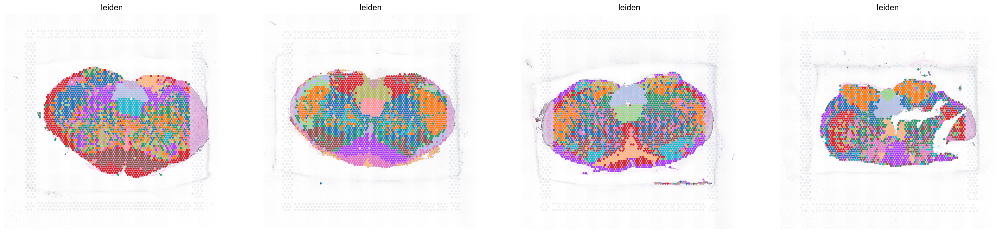

In [4]:
ncol=len(adatas)
nrows=1

plt.figure(figsize=(30, nrows*7))
plt.subplots_adjust(hspace=0.2, wspace=.2)
Fig_ax = 0
            
for n in range(len(adatas)):
    Fig_ax += 1
        
    ax = plt.subplot(nrows, ncol, Fig_ax)
    imgs[n].show(ax=ax)
  
    sc.pl.embedding(adatas[n],frameon=False,
                  color='leiden', 
                  show=False,
                  ax=ax,  
                  legend_fontoutline=180,
                  basis='spatial',
                  size=10,
                  scale_factor=scales[n]
                 # use_raw=True#marker='H'
                   )
    ax.legend_ = None
    
    if n==2 or n==3:
        ax.invert_yaxis()
    
            
       # ax.set(xlabel=None, ylabel=None)
        
        #ax.set_title(p +' pathway',y=1.1, pad=0)       

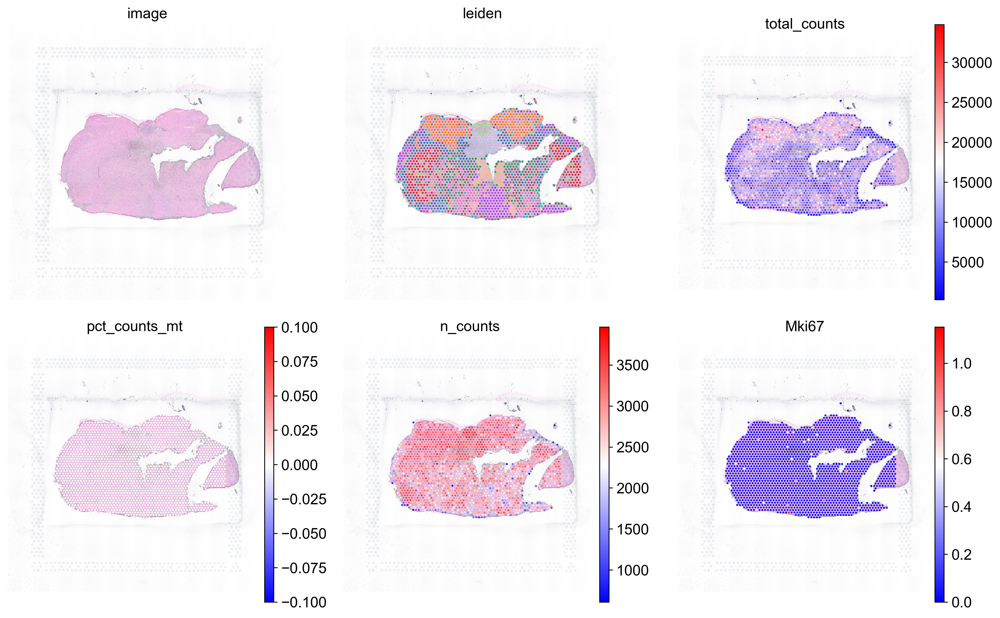

In [5]:
#Plotting of the clusters and the H&E

import math

conditions=[None,'leiden',"total_counts","pct_counts_mt","n_counts","Mki67"]


ncol=3
nrows=math.ceil(len(conditions)/5)
plt.figure(figsize=(16, 10),dpi=150)
plt.subplots_adjust(hspace=0.1, wspace=.2)

for n, QC in enumerate(conditions):
    
    
    ax = plt.subplot(nrows, ncol, n + 1)
    
    if QC == None:        
    
        im.show("image",  ax=ax)
        ax.invert_yaxis()
        #ax.invert_xaxis()
        ax.legend_ = None
        
    else:    
         im.show(ax=ax)
    
         sc.pl.spatial(ad_spat,  
                       frameon=False,
                      img_key=  None, 
                      color=QC, 
                      show=False,
                      ax=ax,  
                      legend_fontoutline=3,                  
                      spot_size =180,
                      scale_factor =scale)
        # ax.invert_yaxis()
      
         ax.legend_ = None
      
   
    #plt.savefig(save_path+'embeddings/'+face+'_QC_clustering_spatial_denoised',dpi=150)

In [132]:
#ad_spat.write('~/data/human_dev_face/h5ad/070623_B1_sagital-mandible.h5ad')

# Start tangram

## Load the data

In [6]:
#adata_st = ad_spat.copy()

adata_sc=sc.read_h5ad(sc_ref) #load reference dataset
sc.pp.log1p(adata_sc)

<Figure size 800x500 with 0 Axes>

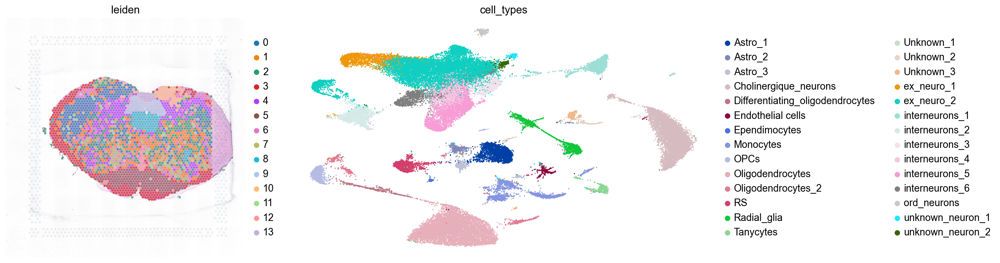

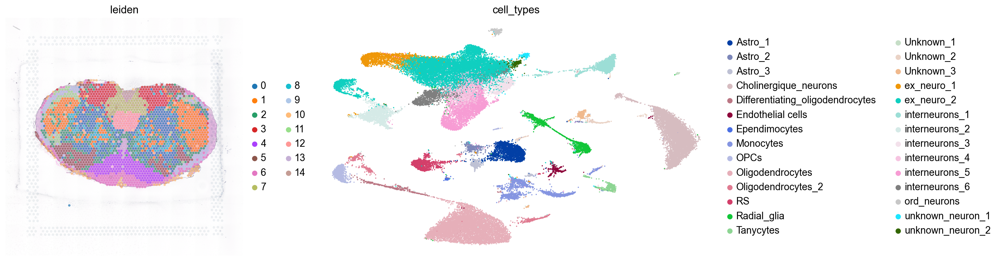

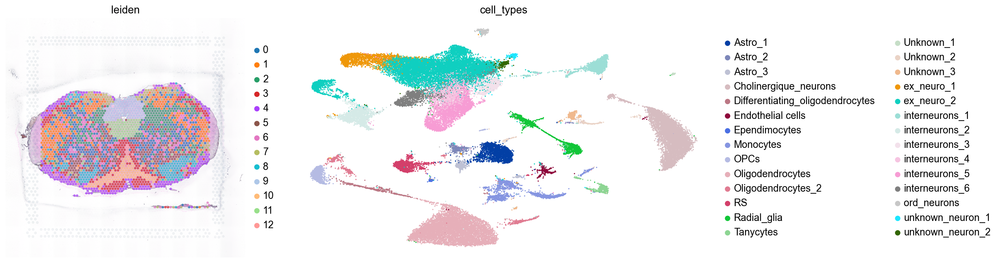

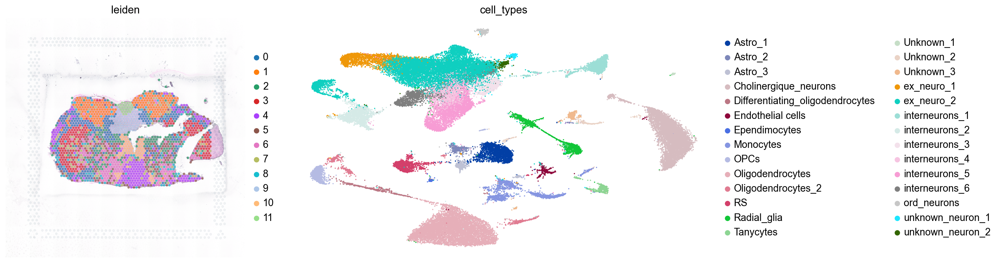

In [7]:
#ncol=2
#nrows=4

#plt.subplots_adjust(hspace=0.1, wspace=.2)
plt.figure(figsize=(16, 10),dpi=50)
for n in range(len(adatas)):
#Plot spatial and ref dataset
    fig, axs = plt.subplots(1, 2, figsize=(20, 5))

    imgs[n].show(ax=axs[0])
    sc.pl.embedding(adatas[n], basis='spatial',color="leiden", alpha=0.7, frameon=False, show=False, ax=axs[0],size=10,
                      scale_factor =scale)
#axs[0].invert_yaxis()

    sc.pl.umap(adata_sc, color="cell_types", size=10, frameon=False, show=False, ax=axs[1])
    
    plt.tight_layout()
    if n==2 or n==3:
        axs[0].invert_yaxis()


In [8]:
sc.tl.rank_genes_groups(adata_sc, groupby="cell_types", use_raw=False)
markers_df = pd.DataFrame(adata_sc.uns["rank_genes_groups"]["names"]).iloc[0:100, :]
markers = list(np.unique(markers_df.melt().value.values))

In [9]:
ad_maps=[]
for n in range(len(adatas)):
    tg.pp_adatas(adata_sc, adatas[n], genes=markers)
    ad_map = tg.map_cells_to_space(adata_sc, adatas[n],
        mode="clusters",
        cluster_label='cell_types',  # .obs field w cell types
        density_prior='rna_count_based',
        num_epochs=500,
         device="cuda:0")
    
    ad_maps.append(ad_map)



INFO:root:944 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:1385 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 944 genes and rna_count_based density_prior in clusters mode...
INFO:root:Printing scores every 100 epochs.


Score: -0.277, KL reg: 0.084
Score: -0.068, KL reg: 0.047
Score: -0.066, KL reg: 0.045
Score: -0.066, KL reg: 0.045
Score: -0.066, KL reg: 0.045


INFO:root:Saving results..
INFO:root:953 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:1436 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 953 genes and rna_count_based density_prior in clusters mode...
INFO:root:Printing scores every 100 epochs.


Score: -0.293, KL reg: 0.081
Score: -0.070, KL reg: 0.049
Score: -0.068, KL reg: 0.047
Score: -0.068, KL reg: 0.047
Score: -0.067, KL reg: 0.046


INFO:root:Saving results..
INFO:root:956 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:1401 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 956 genes and rna_count_based density_prior in clusters mode...
INFO:root:Printing scores every 100 epochs.


Score: -0.276, KL reg: 0.081
Score: -0.065, KL reg: 0.047
Score: -0.063, KL reg: 0.045
Score: -0.063, KL reg: 0.045
Score: -0.063, KL reg: 0.045


INFO:root:Saving results..
INFO:root:927 training genes are saved in `uns``training_genes` of both single cell and spatial Anndatas.
INFO:root:1340 overlapped genes are saved in `uns``overlap_genes` of both single cell and spatial Anndatas.
INFO:root:uniform based density prior is calculated and saved in `obs``uniform_density` of the spatial Anndata.
INFO:root:rna count based density prior is calculated and saved in `obs``rna_count_based_density` of the spatial Anndata.
INFO:root:Allocate tensors for mapping.
INFO:root:Begin training with 927 genes and rna_count_based density_prior in clusters mode...
INFO:root:Printing scores every 100 epochs.


Score: -0.282, KL reg: 0.089
Score: -0.075, KL reg: 0.050
Score: -0.073, KL reg: 0.048
Score: -0.073, KL reg: 0.047
Score: -0.073, KL reg: 0.047


INFO:root:Saving results..


In [10]:
for n in range(len(adatas)):
    tg.project_cell_annotations(ad_maps[n], adatas[n], annotation="cell_types")

INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.
INFO:root:spatial prediction dataframe is saved in `obsm` `tangram_ct_pred` of the spatial AnnData.


In [11]:
import math
# Prep the plotting adatas
predictions=[]
plt.ioff()

for n in range(len(adatas)):
    a=ad.AnnData(adatas[n].obsm['tangram_ct_pred'])
    a.obs=adatas[n].obs
    a.obsm=adatas[n].obsm
    a.uns=adatas[n].uns
    predictions.append(a)
    

#Define the plotting variables    

annotation_list = sorted(list(adatas[0].obsm['tangram_ct_pred'].columns))
to_plot=['leiden']+(annotation_list)
ncol=4
nrows=math.ceil(len(to_plot))

plt.figure(figsize=(30, nrows*5))
plt.subplots_adjust(hspace=0.2, wspace=.2)
Fig_ax = 0



for annot in to_plot:    
    for n in range(len(predictions)):        
        Fig_ax += 1
        
        ax = plt.subplot(nrows, ncol, Fig_ax)
    
        imgs[n].show(ax=ax)
        
        if annot=='leiden':
            sc.pl.spatial(adatas[n], 
                  frameon=False,
                  img_key=None, 
                  color=annot, 
                  show=False,
                  ax=ax,  
                  legend_fontoutline=3,
                  spot_size =180,
                  scale_factor =scale)
        else: 
            
            sc.pl.spatial(predictions[n],vmax=adatas[n].obsm['tangram_ct_pred'].loc[:,annot].quantile(.9), 
                  frameon=False,
                  img_key=None, 
                  color=annot, 
                  show=False,
                  ax=ax,  
                  legend_fontoutline=3,
                  spot_size =180,
                  cmap='viridis',
                  scale_factor =scale,
                         colorbar_loc =None)
        
        if n==0 or n==1:
            ax.invert_yaxis()            
        if n==3:
            ax.invert_xaxis() 
       
        ax.legend_ = None
        plt.tight_layout()
    
plt.savefig(save_path+'/embeddings/Spatial_rat_brains_cell_scores.pdf',dpi=75)

INFO:fontTools.subset:maxp pruned
INFO:fontTools.subset:LTSH dropped
INFO:fontTools.subset:cmap pruned
INFO:fontTools.subset:kern pruned
INFO:fontTools.subset:post pruned
INFO:fontTools.subset:PCLT dropped
INFO:fontTools.subset:JSTF dropped
INFO:fontTools.subset:DSIG dropped
INFO:fontTools.subset:GSUB pruned
INFO:fontTools.subset:name pruned
INFO:fontTools.subset:glyf pruned
INFO:fontTools.subset:Added gid0 to subset
INFO:fontTools.subset:Added first four glyphs to subset
INFO:fontTools.subset:Closing glyph list over 'GSUB': 44 glyphs before
INFO:fontTools.subset:Glyph names: ['.notdef', '.null', 'A', 'C', 'D', 'E', 'M', 'O', 'P', 'R', 'S', 'T', 'U', 'a', 'c', 'd', 'e', 'f', 'five', 'four', 'g', 'h', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'q', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'w', 'x', 'y']
INFO:fontTools.subset:Glyph IDs:   [0, 1, 2, 3, 20, 21, 22, 23, 24, 25, 36, 38, 39, 40, 48, 50, 51, 53, 54, 55, 56, 66, 68, 70, 71, 72, 73, 74